In [1]:
'''
This script shows how to predict stock prices using a basic RNN
'''
import tensorflow as tf
import numpy as np
import matplotlib
import os
import pandas.io.data as web
import datetime
from pandas import read_csv,Series, DataFrame
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.preprocessing import MinMaxScaler
import sqlite3

tf.set_random_seed(777)  # reproducibility
np.set_printoptions(threshold=np.inf)

C:\Program Files\Anaconda3\lib\site-packages\pandas\io\data.py:35: FutureWarning: 
The pandas.io.data module is moved to a separate package (pandas-datareader) and will be removed from pandas in a future version.
After installing the pandas-datareader package (https://github.com/pydata/pandas-datareader), you can change the import ``from pandas.io import data, wb`` to ``from pandas_datareader import data, wb``.
  FutureWarning)


In [2]:
class Indicator:
    def __init__(self):

        try:
            con = sqlite3.connect("../01_KOSPI.db")
            cursor = con.cursor()
            cursor.execute("SELECT * FROM kospi_data")
            rows = cursor.fetchall()

            self.k_date, self.high_price, self.low_price, self.open_price, self.close_price, self.volume, self.turnover, self.sign, self.diff, self.foreigner_net, self.organ_net = [], [], [], [], [], [], [], [], [], [], []

            for row in rows:
                self.k_date.append(datetime.datetime.strptime("%s"%str(row[0]), "%Y%m%d").date())
                self.high_price.append(str(row[1]))
                self.low_price.append(str(row[2]))
                self.open_price.append(str(row[3]))
                self.close_price.append(str(row[4]))
                self.volume.append(str(row[5]))
                self.turnover.append(str(row[6]))
                self.sign.append(str(row[7]))
                self.diff.append(str(row[8]))
                self.foreigner_net.append(str(row[9]))
                self.organ_net.append(str(row[10]))

            self.k_date.reverse()
            self.high_price.reverse()
            self.low_price.reverse()
            self.open_price.reverse()
            self.close_price.reverse()
            self.volume.reverse()
            self.turnover.reverse()
            self.sign.reverse()
            self.diff.reverse()
            self.foreigner_net.reverse()
            self.organ_net.reverse()


            self.k_date = np.array(self.k_date)
            self.high_price = np.array(self.high_price)
            self.low_price = np.array(self.low_price)
            self.open_price = np.array(self.open_price)
            self.close_price = np.array(self.close_price)
            self.volume = np.array(self.volume)
            self.turnover = np.array(self.turnover)
            self.sign = np.array(self.sign)
            self.diff = np.array(self.diff)
            self.foreigner_net = np.array(self.foreigner_net)
            self.organ_net = np.array(self.organ_net)

        except:
            print("error database connection")

In [3]:
# train Parameters
seq_length = 20
data_dim = 7
hidden_dim = 10
output_dim = 1
learning_rate = 0.01
iterations = 5000

In [4]:
# FEATURES = ['k_date', 'high_price', 'low_price', 'open_price', 'close_price', 'volume', 'turnover', 'sign', 'diff', 'foreigner_net', 'organ_net']
FEATURES = ['high_price', 'low_price', 'open_price', 'close_price', 'volume', 'turnover', 'diff']

A = Indicator()
data = {'k_date': A.k_date,
        'high_price': A.high_price,
        'low_price': A.low_price,
        'open_price': A.open_price,
        'close_price' : A.close_price,
        'volume' : A.volume,
        'turnover' : A.turnover,
        'sign' : A.sign,
        'diff' : A.diff,
        'foreigner_net' : A.foreigner_net,
        'organ_net' : A.organ_net
       }
df = DataFrame(data, columns= ['k_date', 'high_price', 'low_price', 'open_price', 'close_price', 'volume', 'turnover', 'sign', 'diff', 'foreigner_net', 'organ_net'])

In [12]:
xy = np.array(df[FEATURES].values[:])
scaler = MinMaxScaler(feature_range=(0, 1))

x = xy
y = np.reshape(df['close_price'].values,(len(df['close_price'].values),1))

# x = scaler.fit_transform(xy)
# pre_y = scaler.fit_transform(np.array(df['close_price'].values))
# y = np.reshape(pre_y,(len(pre_y),1))

In [10]:
def prediction():
    profit = []
    for i in range(len(df['close_price'])-1):
        if df['close_price'][i+19] < df['close_price'][i+20]:
            profit.append('1')
        else :
            profit.append('0')

    return profit

In [11]:
df['close_price']

0        884.29
1        886.68
2        878.42
3        885.85
4        887.75
5        891.97
6        892.86
7        883.27
8        887.52
9        897.67
10       900.05
11       894.15
12       895.68
13       900.44
14       908.88
15       914.88
16       917.70
17       924.32
18       924.45
19       917.08
20       918.60
21       922.44
22       917.90
23       916.34
24       909.72
25       913.62
26       921.53
27       923.20
28       939.49
29       950.87
         ...   
7427    2148.61
7428    2134.88
7429    2145.76
7430    2148.46
7431    2138.40
7432    2149.15
7433    2165.04
7434    2173.74
7435    2196.85
7436    2207.84
7437    2209.46
7438    2205.44
7439    2219.67
7440    2241.24
7441    2292.76
7442    2270.12
7443    2296.37
7444    2286.02
7445    2290.65
7446    2295.33
7447    2293.08
7448    2286.82
7449    2288.48
7450    2304.03
7451    2311.74
7452    2317.34
7453    2342.93
7454    2355.30
7455    2352.97
7456    2343.68
Name: close_price, dtype

In [9]:
profit = np.array(prediction())
profit

array(['1', '0', '1', '1', '1', '1', '0', '1', '1', '1', '0', '1', '1',
       '1', '1', '1', '1', '1', '0', '1', '1', '0', '0', '0', '1', '1',
       '1', '1', '1', '1', '1', '0', '1', '1', '0', '0', '1', '1', '0',
       '1', '0', '1', '0', '1', '1', '1', '0', '1', '0', '0', '1', '0',
       '1', '0', '0', '0', '1', '0', '1', '1', '0', '0', '0', '0', '0',
       '1', '0', '0', '1', '0', '1', '1', '0', '0', '1', '1', '0', '1',
       '1', '0', '0', '0', '0', '1', '0', '1', '1', '0', '0', '1', '0',
       '1', '1', '0', '1', '0', '0', '0', '0', '0', '0', '1', '1', '1',
       '1', '0', '1', '0', '0', '0', '0', '1', '0', '0', '0', '0', '0',
       '0', '0', '0', '0', '0', '1', '1', '0', '0', '1', '0', '0', '1',
       '1', '0', '0', '1', '1', '0', '1', '0', '0', '0', '1', '0', '0',
       '1', '0', '1', '0', '1', '0', '0', '1', '1', '1', '1', '1', '0',
       '1', '0', '0', '0', '0', '1', '1', '1', '1', '1', '0', '1', '1',
       '1', '1', '0', '1', '0', '0', '0', '0', '0', '1', '0', '0

In [13]:
# build a dataset
dataX = []
dataY = []
for i in range(0, len(y) - seq_length):
    _x = x[i:i + seq_length]
    _y = y[i + seq_length]  # Next close price
    print(_x, "->", _y)
    dataX.append(_x)
    dataY.append(_y)

[['884.29' '881.19' '881.30' '884.29' '16635' '379268' '0.33']
 ['886.68' '884.38' '884.38' '886.68' '14526' '332817' '0.27']
 ['886.73' '878.03' '886.73' '878.42' '9526' '218413' '-0.93']
 ['886.60' '878.78' '878.78' '885.85' '14877' '342497' '0.84']
 ['887.75' '886.23' '886.23' '887.75' '12449' '272090' '0.21']
 ['892.43' '888.03' '888.03' '891.97' '14250' '312968' '0.47']
 ['892.88' '891.25' '892.32' '892.86' '16715' '361703' '0.10']
 ['892.80' '882.29' '892.80' '883.27' '11241' '244601' '-1.07']
 ['887.52' '882.78' '883.31' '887.52' '8274' '182890' '0.48']
 ['897.67' '887.79' '887.79' '897.67' '16953' '396961' '1.14']
 ['901.41' '897.52' '897.52' '900.05' '14780' '348503' '0.27']
 ['900.45' '894.15' '900.07' '894.15' '14034' '330545' '-0.65']
 ['895.68' '892.15' '893.96' '895.68' '11764' '283399' '0.17']
 ['901.06' '895.76' '895.76' '900.44' '13261' '309681' '0.53']
 ['908.88' '900.59' '900.59' '908.88' '9562' '226628' '0.94']
 ['918.34' '909.08' '909.08' '914.88' '15025' '367840' 

In [ ]:
# train/test split
train_size = int(len(dataY) * 0.7)
test_size = len(dataY) - train_size
trainX, testX = np.array(dataX[0:train_size]), np.array(dataX[train_size:len(dataX)])
trainY, testY = np.array(dataY[0:train_size]), np.array(dataY[train_size:len(dataY)])
x_index = df.k_date[train_size:len(dataX)]

In [ ]:
# input place holders
X = tf.placeholder(tf.float32, [None, seq_length, data_dim])
Y = tf.placeholder(tf.float32, [None, 1])

In [ ]:
# build a LSTM network
cell = tf.contrib.rnn.BasicLSTMCell(num_units=hidden_dim, state_is_tuple=True, activation=tf.tanh)
outputs, _states = tf.nn.dynamic_rnn(cell, X, dtype=tf.float32)
Y_pred = tf.contrib.layers.fully_connected(outputs[:, -1], output_dim, activation_fn=None)  # We use the last cell's output

In [ ]:
# cost/loss
loss = tf.reduce_sum(tf.square(Y_pred - Y))  # sum of the squares
# optimizer
optimizer = tf.train.AdamOptimizer(learning_rate)
train = optimizer.minimize(loss)

In [ ]:
# MAE/RMSE/MAPE
targets = tf.placeholder(tf.float32, [None, 1])
predictions = tf.placeholder(tf.float32, [None, 1])
mae = tf.reduce_mean(tf.abs(targets - predictions))
rmse = tf.sqrt(tf.reduce_mean(tf.square(targets - predictions)))
mape = 100*tf.reduce_mean(tf.abs((targets-predictions)/targets))

[step: 3830] loss: 0.22385922074317932
[step: 3831] loss: 0.22385679185390472
[step: 3832] loss: 0.22385470569133759
[step: 3833] loss: 0.22385233640670776
[step: 3834] loss: 0.22385022044181824
[step: 3835] loss: 0.22384795546531677
[step: 3836] loss: 0.22384564578533173
[step: 3837] loss: 0.22384361922740936
[step: 3838] loss: 0.2238413244485855
[step: 3839] loss: 0.22383910417556763
[step: 3840] loss: 0.22383692860603333
[step: 3841] loss: 0.22383463382720947
[step: 3842] loss: 0.22383242845535278
[step: 3843] loss: 0.2238302379846573
[step: 3844] loss: 0.2238280326128006
[step: 3845] loss: 0.22382576763629913
[step: 3846] loss: 0.22382357716560364
[step: 3847] loss: 0.22382137179374695
[step: 3848] loss: 0.22381922602653503
[step: 3849] loss: 0.22381703555583954
[step: 3850] loss: 0.2238147109746933
[step: 3851] loss: 0.22381258010864258
[step: 3852] loss: 0.2238103598356247
[step: 3853] loss: 0.22380809485912323
[step: 3854] loss: 0.2238059937953949
[step: 3855] loss: 0.2238036394

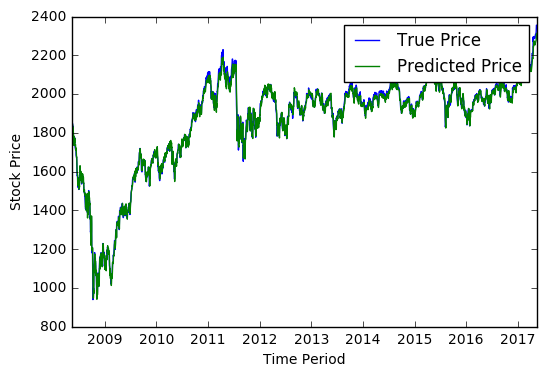

In [ ]:
with tf.Session() as sess:
    init = tf.global_variables_initializer()
    sess.run(init)

    # Training step
    for i in range(iterations):
        _, step_loss = sess.run([train, loss], feed_dict={X: trainX, Y: trainY})
        print("[step: {}] loss: {}".format(i, step_loss))

    # Test step
    test_predict = sess.run(Y_pred, feed_dict={X: testX})
    mae_val = sess.run(mae, feed_dict={targets: testY, predictions: test_predict})
    rmse_val = sess.run(rmse, feed_dict={targets: testY, predictions: test_predict})
    mape_val = sess.run(mape, feed_dict={targets: testY, predictions: test_predict})

    print("MAE: {}".format(mae_val))
    print("RMSE: {}".format(rmse_val))
    print("MAPE: {}".format(mape_val))

    new_y = scaler.inverse_transform(testY)
    new_pred_y = scaler.inverse_transform(test_predict)

    mae_val2 = sess.run(mae, feed_dict={targets: new_y, predictions: new_pred_y})
    rmse_val2 = sess.run(rmse, feed_dict={targets: new_y, predictions: new_pred_y})
    mape_val2 = sess.run(mape, feed_dict={targets: new_y, predictions: new_pred_y})

    print("MAE2: {}".format(mae_val2))
    print("RMSE2: {}".format(rmse_val2))
    print("MAPE2: {}".format(mape_val2))
    
    
    
    
    # Plot predictions
    
#     plt.plot(testY) -> 스케일 조정 전 아웃풋
#     plt.plot(test_predict)

    plt.plot(x_index, new_y, label= "True Price")
    plt.plot(x_index, new_pred_y, label= "Predicted Price")    
    plt.xlabel("Time Period")
    plt.ylabel("Stock Price")
    plt.legend()
    plt.show()